In [69]:
import matplotlib.pyplot as plt
import corner

In [70]:
import pandas as pd

# Path to the specific file
file_path = "/home/localuser/Documents/DataAnalysis/lec5/Kepler/spec_001723700.txt"
# file_path = '/home/localuser/Documents/DataAnalysis/lec5/Kepler/spec_003645232.txt'

# Function to parse the specified Kepler data file
def parse_kepler_file(filepath):
    metadata = {}
    data = []
    with open(filepath, 'r') as file:
        lines = file.readlines()
        
        # Extract metadata from header
        for line in lines:
            if line.startswith("#"):
                if "mission" in line or "ID" in line or "numax" in line or "Dnu" in line:
                    key, value = line.strip("#").strip().split(maxsplit=1)
                    metadata[key.strip()] = value.strip()
            else:
                # Extract numerical data
                try:
                    freq, power = map(float, line.split())
                    data.append((freq, power))
                except ValueError:
                    continue
    
    # Convert data to DataFrame
    data_df = pd.DataFrame(data, columns=["Frequency (microHz)", "Power Density (ppm^2/microHz)"])
    return metadata, data_df

# Parse the specified file
metadata, data_df = parse_kepler_file(file_path)

# Display metadata and data
metadata, data_df.head()


({'mission': 'Kepler', 'ID': '001723700', 'numax': '39.23', 'Dnu': '4.483'},
    Frequency (microHz)  Power Density (ppm^2/microHz)
 0             0.008640                     3528.16330
 1             0.017280                      674.45061
 2             0.025919                     1682.54830
 3             0.034559                    12423.36900
 4             0.043199                     7557.20890)

/tmp/ipykernel_47736/1624685044.py:8: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim(0, 100)


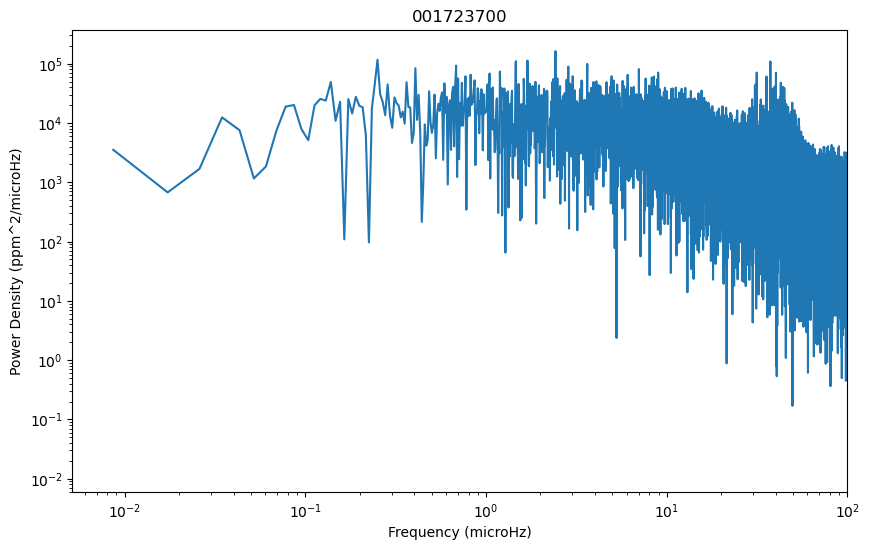

In [71]:
# data_df
plt.figure(figsize=(10, 6))
# 
plt.loglog(data_df["Frequency (microHz)"], data_df["Power Density (ppm^2/microHz)"])
plt.xlabel("Frequency (microHz)")
plt.ylabel("Power Density (ppm^2/microHz)")
# plt.yscale("log")
plt.xlim(0, 100)
plt.title(metadata["ID"])
# plt.yscale("log")
plt.show()



In [72]:
import numpy as np
import matplotlib.pyplot as plt
import emcee
def noisModel(nu, B_nu_max, beta, A, nu_max, sigma, P_photon):
    background = B_nu_max * (nu / nu_max)**beta
    # gaussian = A * np.exp(-0.5 * ((nu - nu_max) / sigma)**2)
    return background  + P_photon
# Define the power spectrum model
def power_spectrum_model(nu, B_nu_max, beta, A, nu_max, sigma, P_photon):
    background = B_nu_max * (nu / nu_max)**beta
    gaussian = A * np.exp(-0.5 * ((nu - nu_max) / sigma)**2)
    return background + gaussian + P_photon

# Log-likelihood function
def log_likelihood(params, nu, power_density):
    B_nu_max, beta, A, nu_max, sigma, P_photon = params
    model = power_spectrum_model(nu, B_nu_max, beta, A, nu_max, sigma, P_photon)
    return - np.sum(np.log(model)+ power_density/model)

def log_prior(params):
    B_nu_max, beta, A, nu_max, sigma, P_photon = params
    if 0 < B_nu_max < 1e6 and -2< beta < -1 and 0 < A < 1e6 and 35 < nu_max < 45 and 0 < sigma < 10 and 0 < P_photon < 1e3:
        return 0.0
    return -np.inf

# Combined log-probability function
def log_probability(params, nu, power_density):
    lp = log_prior(params)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(params, nu, power_density)



In [73]:
##############################################################
# 
# mission     Kepler
# ID       001723700
# numax      39.23
# Dnu        4.483
# epsilon    0.961
# alpha     0.0098
# background  1573.04  -1.51
# magV        0.00
# Teff        4896
# logg        2.53
# Z          -0.34

b_nu_max = 1573.04
beta = -1.51
A = 1e4
nu_max = 39.23
sigma = 5
P_photon = 1e2  
params = [b_nu_max, beta, A, nu_max, sigma, P_photon]

#  Run the MCMC sampler
ndim = len(params)
nwalkers = 32
nsteps = 1000
pos = params + 1e-4 * np.random.randn(nwalkers, ndim)*params
freq = data_df["Frequency (microHz)"]
psd = data_df["Power Density (ppm^2/microHz)"]
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(freq[freq > 10], psd[freq > 10]))
sampler.run_mcmc(pos, nsteps, progress=True)



100%|██████████| 1000/1000 [00:54<00:00, 18.51it/s]


State([[ 7.53308409e+02 -1.99022066e+00  3.44387817e+03  3.81256815e+01
   8.20681342e+00  4.41473878e+02]
 [ 7.52485230e+02 -1.99692001e+00  3.35535895e+03  3.78551309e+01
   8.44404752e+00  4.41694883e+02]
 [ 7.64615475e+02 -1.99228654e+00  3.31786001e+03  3.79616695e+01
   8.32057814e+00  4.33525490e+02]
 [ 7.22438027e+02 -1.98813580e+00  3.46208868e+03  3.80936297e+01
   8.22688007e+00  4.36665693e+02]
 [ 7.14937240e+02 -1.99735922e+00  3.51635644e+03  3.77961194e+01
   8.19892166e+00  4.43062842e+02]
 [ 7.18544643e+02 -1.99935326e+00  3.50721170e+03  3.80883563e+01
   8.40898146e+00  4.42412246e+02]
 [ 7.20952616e+02 -1.99647428e+00  3.43174988e+03  3.82984326e+01
   8.13654325e+00  4.38698887e+02]
 [ 7.27598145e+02 -1.97351978e+00  3.13782005e+03  3.85637802e+01
   8.12011618e+00  4.37384927e+02]
 [ 7.39764929e+02 -1.99736003e+00  3.29982914e+03  3.76189646e+01
   8.62661931e+00  4.39989284e+02]
 [ 7.24997939e+02 -1.99393185e+00  3.50881526e+03  3.85430599e+01
   7.84318010e+00  

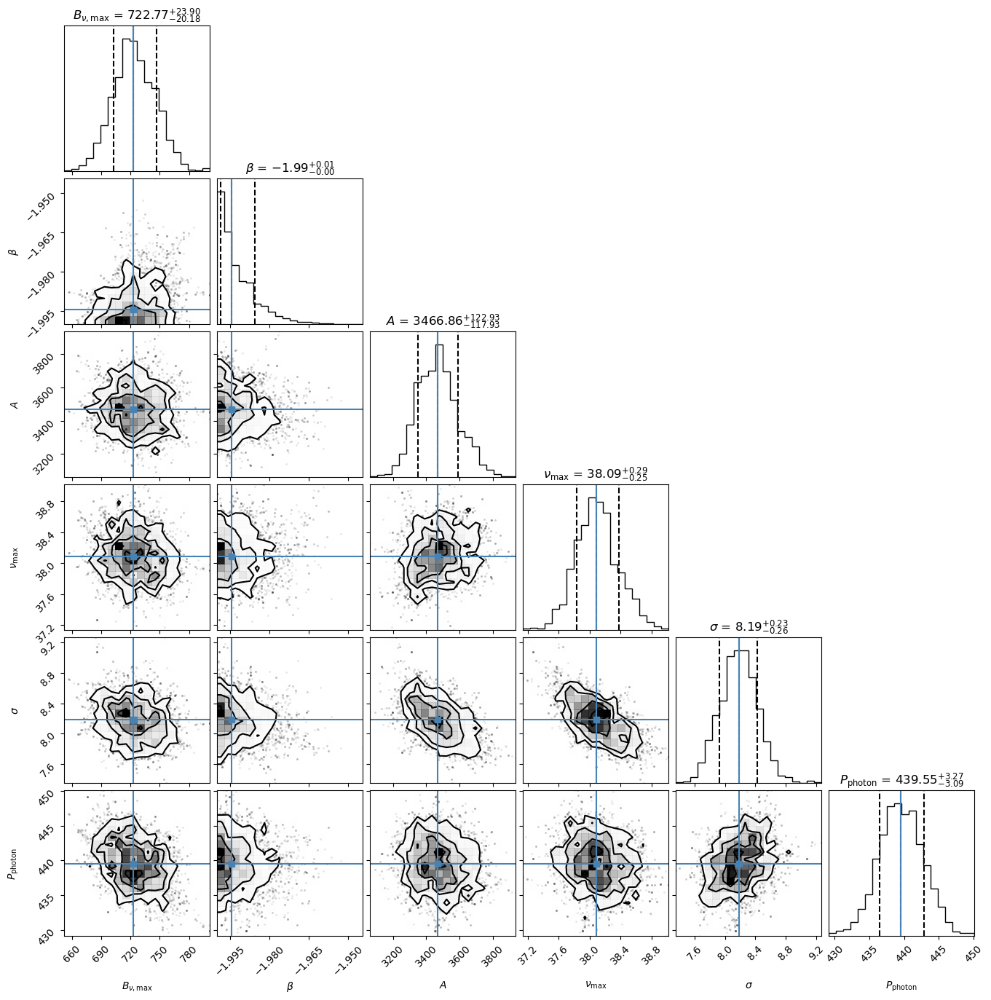

In [74]:
import corner

# Extract the samples from the MCMC sampler
samples = sampler.get_chain(flat=True, discard=800)
best_params = np.median(samples, axis=0)


# Parameter labels for the corner plot
labels = [r"$B_{\nu,\mathrm{max}}$", r"$\beta$", r"$A$", r"$\nu_\mathrm{max}$", r"$\sigma$", r"$P_\mathrm{photon}$"]

# Generate the corner plot
fig = corner.corner(
    samples,
    labels=labels,
    truths=best_params,  # Optional: overlay the initial parameter guesses
    quantiles=[0.16, 0.5, 0.84],  # Show 16th, 50th, and 84th percentiles
    show_titles=True,  # Display the mean ± std in the diagonal plots
    title_fmt=".2f",   # Format for the titles
)

# Show the plot
plt.show()


In [75]:
#get_the_samples
samples = sampler.get_chain(discard=800, flat=True)
# get the best model
best_model = np.median(samples, axis=0)


In [76]:
nu_max=best_model[3]

In [77]:
print('nu_max',nu_max)

nu_max 38.08846400123794


In [78]:
# def power_spectrum_model(nu, B_nu_max, beta, A, nu_max, sigma, P_photon):
all_model = power_spectrum_model(data_df["Frequency (microHz)"],*best_model)
k=noisModel(data_df["Frequency (microHz)"],*best_model)

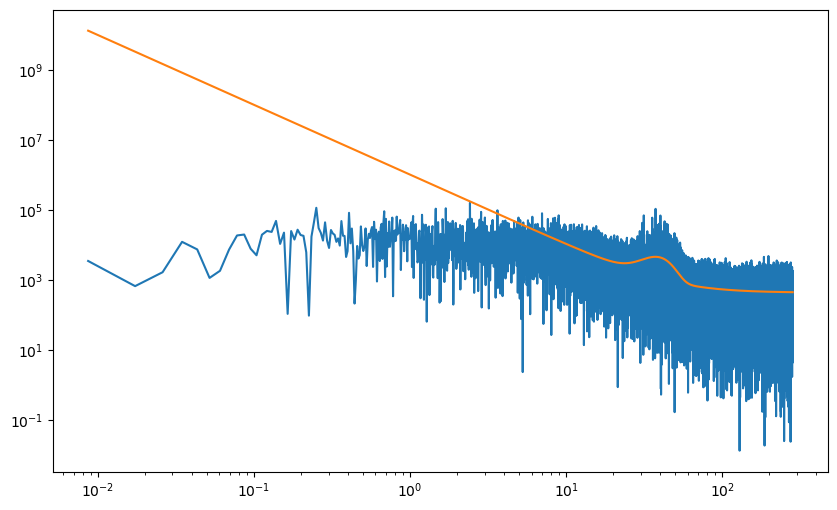

In [79]:
plt.figure(figsize=(10, 6))
plt.loglog(data_df["Frequency (microHz)"], data_df["Power Density (ppm^2/microHz)"], label="Data")
plt.loglog(data_df["Frequency (microHz)"],all_model   , label="Model")
plt.show()

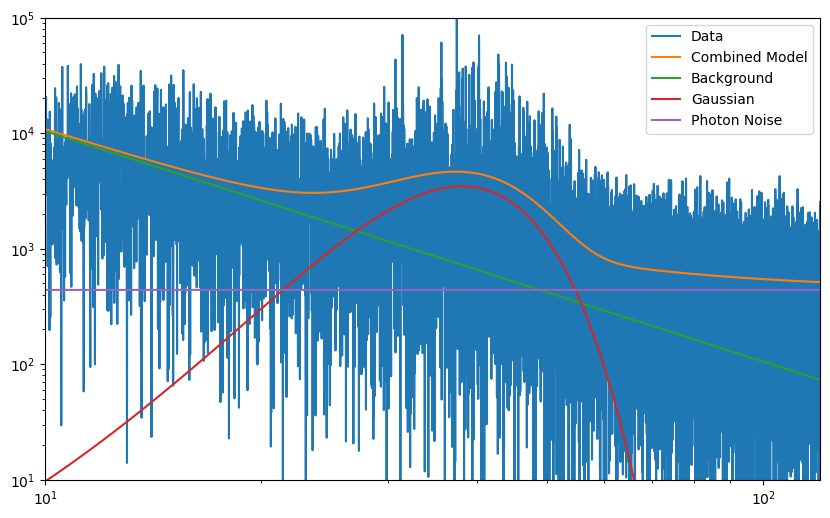

In [80]:
# plot all the components
plt.figure(figsize=(10, 6))
plt.loglog(data_df["Frequency (microHz)"], data_df["Power Density (ppm^2/microHz)"], label="Data")
plt.loglog(data_df["Frequency (microHz)"],all_model, label="Combined Model")
plt.loglog(data_df["Frequency (microHz)"],best_model[0] * (data_df["Frequency (microHz)"] / best_model[3])**best_model[1], label="Background")
plt.loglog(data_df["Frequency (microHz)"],best_model[2] * np.exp(-0.5 * ((data_df["Frequency (microHz)"] - best_model[3]) / best_model[4])**2), label="Gaussian")
# photon noise is constant 
plt.loglog(data_df["Frequency (microHz)"],np.ones(len(data_df["Frequency (microHz)"]))*best_model[5], label="Photon Noise")
plt.ylim(10,1e5)
plt.xlim(10,120)
plt.legend()


In [81]:
orginal_signal=data_df["Power Density (ppm^2/microHz)"] - k
# orginal_signal2 = data_df["Power Density (ppm^2/microHz)"] - all_model

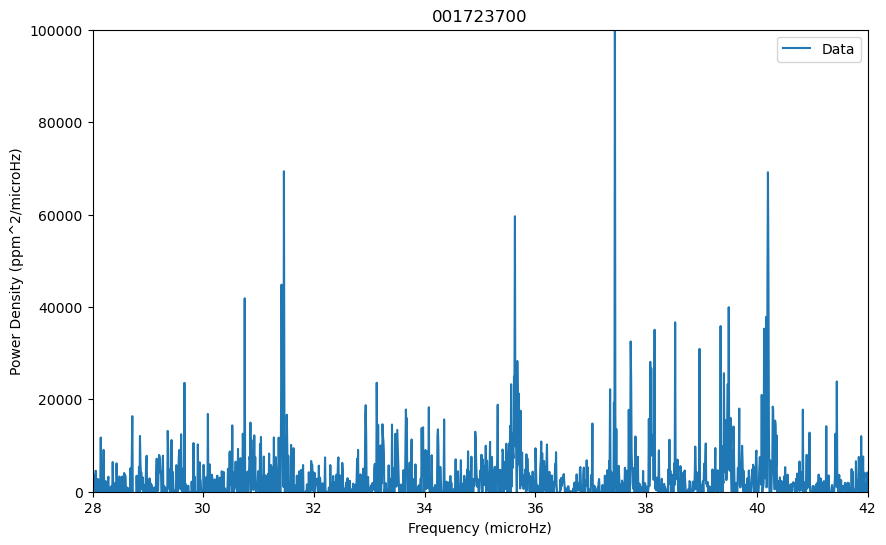

In [82]:
plt.figure(figsize=(10, 6))
plt.plot(data_df["Frequency (microHz)"], orginal_signal, label="Data")
# plt.xlim(28, 42)
# plt.xlabel("Frequency (microHz)")
# plt.ylim(0, 1e5)
# plt.show()
# plt.figure(figsize=(10, 6))
# plt.plot(data_df["Frequency (microHz)"],orginal_signal2   , label="Model")
# plt.loglog(data_df["Frequency (microHz)"],k  , label="Model")
plt.xlim(28, 42)
plt.xlabel("Frequency (microHz)")
plt.ylim(0, 1e5)
plt.ylabel("Power Density (ppm^2/microHz)")
plt.legend()
plt.title(metadata["ID"])
plt.show()


# Lorentzian the second fit.... 


In [83]:
# def lorentzian_model(nu, H, Gamma, delta_nu, alpha, eps, d_0l, n_min, n_max):
#     lorentzian_sum = np.zeros_like(nu)
#     n_max_value = (nu_max / delta_nu) - eps  # Central radial order

#     for n in range(n_min, n_max + 1):  # Sum over radial orders
#         nu_0 = (n + l / 2 + eps + d_0l + alpha * (n - n_max_value) ** 2 / 2) * delta_nu
#         lorentzian_sum += H / (1 + 4 * ((nu - nu_0) / Gamma) ** 2)
    
#     return lorentzian_sum

delta_nu = 4.483
eps = 0.961
alpha = 0.0098

def lorentzian(nu, H, nu_center, Gamma):
    return H / (1 + 4 * ((nu - nu_center) / Gamma)**2)

def lorentzian_model(nu, H1, H2, Gamma1, Gamma2, d_0l):
    n_max_value = (nu_max / delta_nu) - eps  # Central radial order
    nu_center_1 = ((n + 0 / 2 + eps + 0 + alpha / 2 * (n - n_max_value)**2) * delta_nu)
    nu_center_2 = ((n - 1 + 2 / 2 + eps + d_0l + alpha / 2 * (n - 1 - n_max_value)**2) * delta_nu)
    
    return lorentzian(nu, H1, nu_center_1, Gamma1) + lorentzian(nu, H2, nu_center_2, Gamma2)

def log_likelihood_lorentzian(params, nu, power_density):
    H1, H2, Gamma1, Gamma2, d_0l = params
    model = lorentzian_model(nu, H1, H2, Gamma1, Gamma2, d_0l)
    return - np.sum(np.log(model)+ power_density/model)


def log_prior_lorentzian(params):
    H1, H2, Gamma1, Gamma2, d_0l = params
    if 1e4 < H1 < 6e4 and 1e2< H2 < 4e4 and 0.01 < Gamma1 < 1 and 0.01 < Gamma2 < 1 and -1 < d_0l < -0.01:
        return 0.0  # Uniform prior
    return -np.inf


def log_probability_lorentzian(params, nu, power_density):
    lp = log_prior_lorentzian(params)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood_lorentzian(params, nu, power_density)


In [84]:
# Define the range of radial orders (e.g., 8 to 13)
n = 8

# Initial guess
initial_params = [5e4, 2e4, 0.25, 0.25, -0.15]  # Initial guesses for H, Gamma, etc.

# MCMC parameters
ndim = len(initial_params)
nwalkers = 50
nsteps = 2000  # Increase steps for better convergence
pos = initial_params + 1e-4 * np.random.randn(nwalkers, ndim) * initial_params

# Initialize sampler
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability_lorentzian, args=(freq[(freq > 39) & (freq < 40.5)], psd[(freq > 39) & (freq < 40.5)]))
sampler.run_mcmc(pos, nsteps, progress=True)

# Analyze results
samples = sampler.get_chain(discard=1700, flat=True)
best_fit_params = np.median(samples, axis=0)
print("Best-fit parameters:", best_fit_params)


100%|██████████| 2000/2000 [01:15<00:00, 26.46it/s]

Best-fit parameters: [ 2.46390629e+04  8.50857487e+03  1.37524718e-01  4.78805495e-01
 -1.63984182e-01]


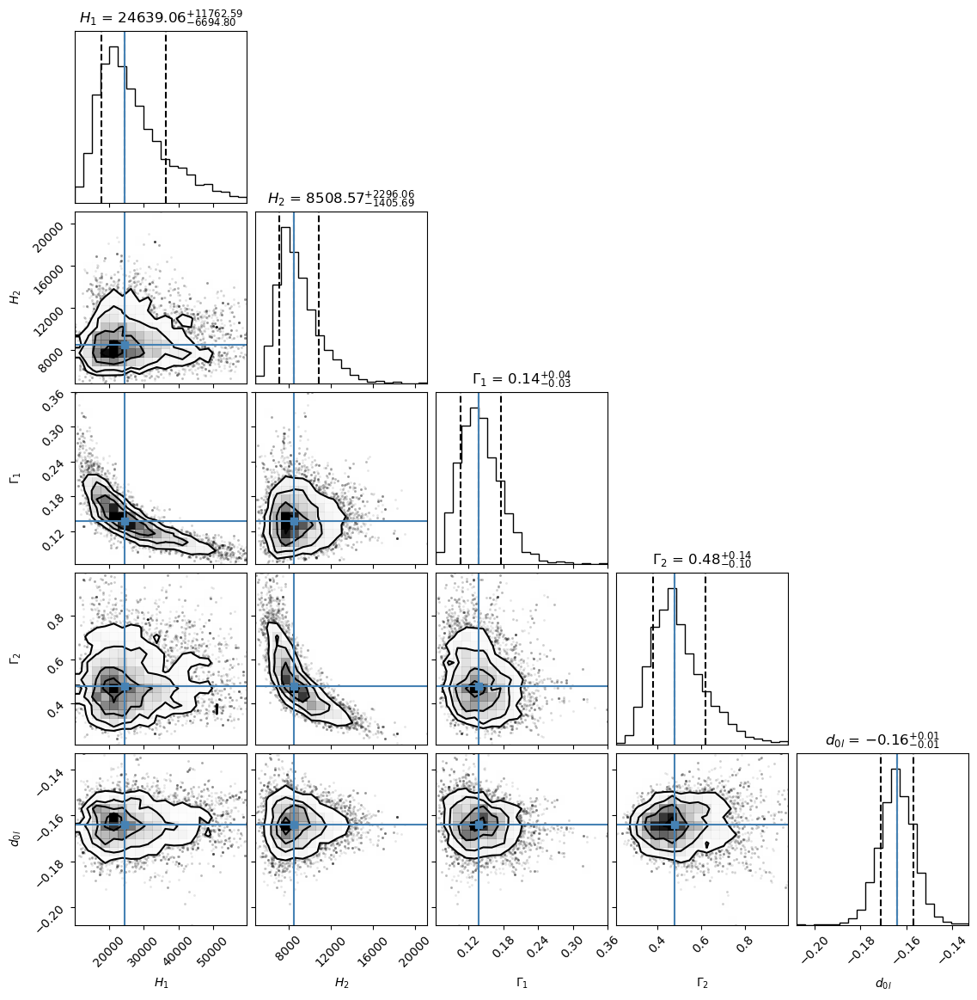

In [85]:
# Generate the corner plot for the Lorentzian model
fig = corner.corner(
    samples,
    labels=[r"$H_1$", r"$H_2$", r"$\Gamma_1$", r"$\Gamma_2$", r"$d_{0l}$"],
    truths=best_fit_params,  # Optional: overlay the initial parameter guesses
    quantiles=[0.16, 0.5, 0.84],  # Show 16th, 50th, and 84th percentiles
    show_titles=True,  # Display the mean ± std in the diagonal plots
    title_fmt=".2f",   # Format for the titles
)

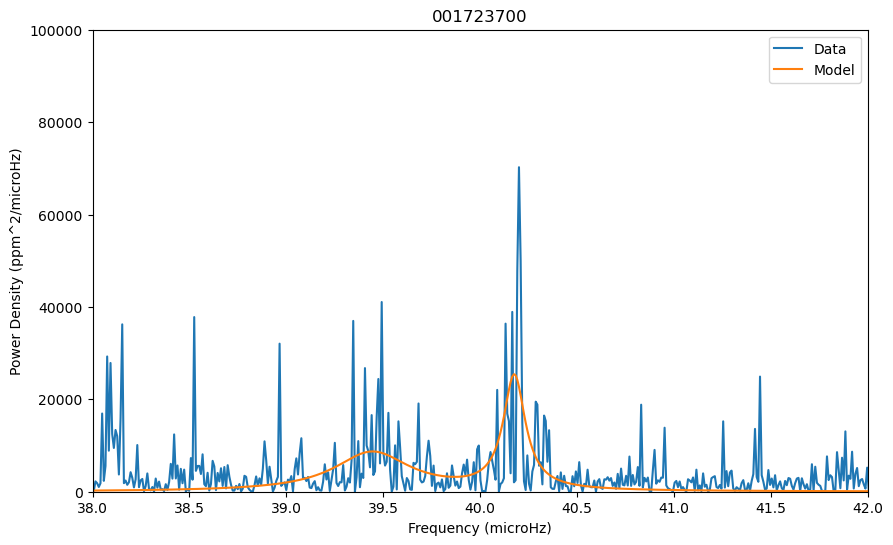

In [86]:
# plot the Lorentzian model for the entire frequency range 28-42 microHz 
plt.figure(figsize=(10, 6))
plt.plot(data_df["Frequency (microHz)"], data_df["Power Density (ppm^2/microHz)"], label="Data")
plt.plot(data_df["Frequency (microHz)"], lorentzian_model(data_df["Frequency (microHz)"], *best_fit_params), label="Model")
plt.xlim(38, 42)
plt.ylim(0, 1e5)
plt.xlabel("Frequency (microHz)")
plt.ylabel("Power Density (ppm^2/microHz)")
plt.legend()
plt.title(metadata["ID"])
plt.show()


In [87]:
alpha = 0.0098

def lorentzian(frequency, H, nu_center, Gamma):
    """Single Lorentzian function."""
    return H / (1 + 4 * ((frequency - nu_center) / Gamma)**2)

def lorentzian_sum(frequency, heights_l0, heights_l2, gammas_l0, gammas_l2, epsilon, d02, Delta_nu):
    """
    Summation over specific radial orders n=6 and n=7 for l=0 and l=2 modes.
    Each radial order has its own height and linewidth (Gamma).
    """
    n_radial_values = [6, 7]  # Radial orders n=6 and n=7
    n_max = nu_max / Delta_nu - epsilon
    total_model = 0

    for i, n in enumerate(n_radial_values):
        # Frequency centers for l=0 and l=2
        nu_center_l0 = ((n + 1 + epsilon + alpha / 2 * (n + 1 - n_max)**2) * Delta_nu)  # l=0
        nu_center_l2 = ((n + 2 / 2 + epsilon + d02 + alpha / 2 * (n - n_max)**2) * Delta_nu)  # l=2

        # Add Lorentzians with n-dependent heights and Gamma
        total_model += lorentzian(frequency, heights_l0[i], nu_center_l0, gammas_l0[i])  # l=0
        total_model += lorentzian(frequency, heights_l2[i], nu_center_l2, gammas_l2[i])  # l=2

    return total_model

def log_likelihood(theta, frequency, power_density):
    epsilon, d02, Delta_nu = theta[:3]
    heights_l0 = theta[3:5]
    heights_l2 = theta[5:7]
    gammas_l0 = theta[7:9]
    gammas_l2 = theta[9:11]

    model = lorentzian_sum(frequency, heights_l0, heights_l2, gammas_l0, gammas_l2, epsilon, d02, Delta_nu)
    return -np.sum(np.log(model) + power_density / model)

def log_prior(theta):
    epsilon, d02, Delta_nu = theta[:3]
    heights_l0 = theta[3:5]
    heights_l2 = theta[5:7]
    gammas_l0 = theta[7:9]
    gammas_l2 = theta[9:11]

    # Core parameter priors
    if not (0.01 < epsilon < 1.0 and -1.0 < d02 < 0.0 and 3 < Delta_nu < 6):
        return -np.inf

    # Heights priors
    if not (np.all(2e4 < heights_l0) and np.all(heights_l0 < 5e4) and
            np.all(1e4 < heights_l2) and np.all(heights_l2 < 3e4)):
        return -np.inf

    # Gamma priors
    if not (np.all(0.01 < gammas_l0) and np.all(gammas_l0 < 1) and
            np.all(0.01 < gammas_l2) and np.all(gammas_l2 < 1)):
        return -np.inf

    return 0.0

def log_probability(theta, frequency, power_density):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(theta, frequency, power_density)

# Data subset for peak region
frequency_peak = freq[((freq > 34.5) & (freq < 36)) | ((freq > 39) & (freq < 41))]
power_density_peak = psd[((freq > 34.5) & (freq < 36)) | ((freq > 39) & (freq < 41))]

# Initial guesses
initial_guess = [
    0.9, -0.1, 4.5,  # epsilon, d02, Delta_nu
    4e4, 4e4,  # Heights l=0
    2e4, 2e4,  # Heights l=2
    0.25, 0.25,  # Gammas l=0
    0.25, 0.25   # Gammas l=2
]

# MCMC setup
ndim = len(initial_guess)
nwalkers = 50
pos = initial_guess + 1e-2 * np.random.randn(nwalkers, ndim) * initial_guess

# Run MCMC
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(frequency_peak, power_density_peak))
sampler.run_mcmc(pos, 10000, progress=True)

# Analyze results
samples = sampler.get_chain(discard=5000, flat=True)
best_params = np.median(samples, axis=0)
print("Best-fit parameters:", best_params)


100%|██████████| 10000/10000 [08:39<00:00, 19.26it/s]

Best-fit parameters: [ 7.98945133e-01 -1.64154611e-01  4.56971806e+00  2.35664314e+04
  2.09130573e+04  1.04043792e+04  1.11506858e+04  1.73723389e-01
  3.51900884e-01  3.26537661e-01  3.14739409e-01]


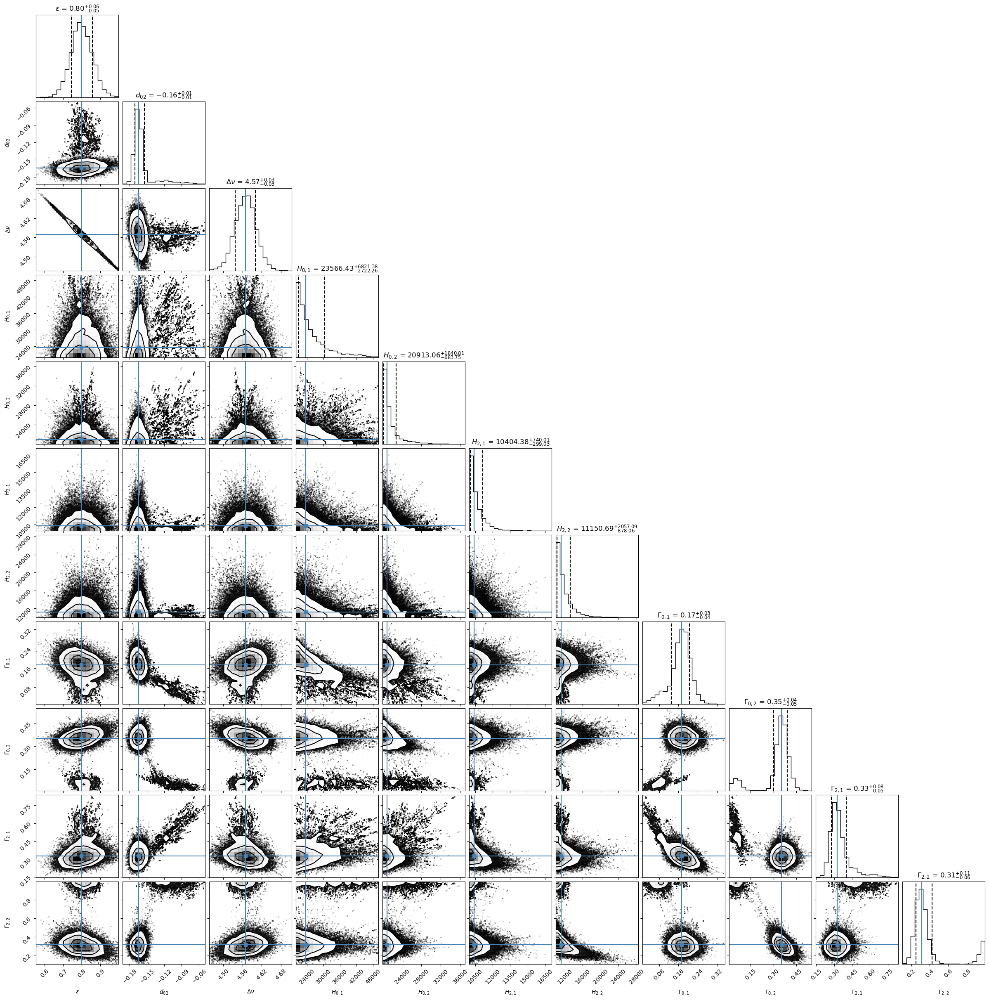

In [88]:
# Generate the corner plot for the Lorentzian model
fig = corner.corner(
    samples,
    labels=[
        r"$\epsilon$", r"$d_{02}$", r"$\Delta\nu$",
        r"$H_{0,1}$", r"$H_{0,2}$", r"$H_{2,1}$", r"$H_{2,2}$",
        r"$\Gamma_{0,1}$", r"$\Gamma_{0,2}$", r"$\Gamma_{2,1}$", r"$\Gamma_{2,2}$"
    ],
    truths=best_params,  # Optional: overlay the initial parameter guesses
    quantiles=[0.16, 0.5, 0.84],  # Show 16th, 50th, and 84th percentiles
    show_titles=True,  # Display the mean ± std in the diagonal plots
    title_fmt=".2f",   # Format for the titles
)

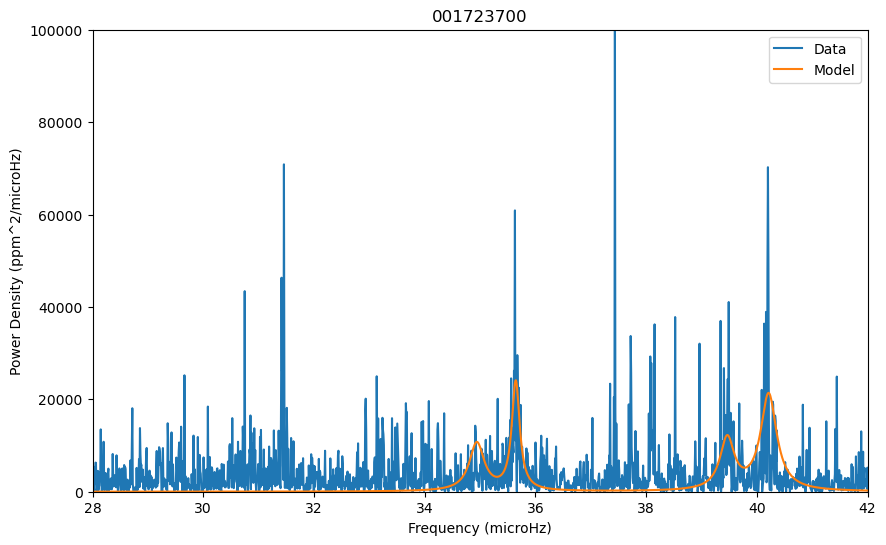

In [89]:
# Extract parameters from the best-fit parameters
epsilon, d02, Delta_nu = best_params[:3]
heights_l0 = best_params[3:5]
heights_l2 = best_params[5:7]
gammas_l0 = best_params[7:9]
gammas_l2 = best_params[9:11]

# Plot the Lorentzian model for the entire frequency range 28-42 microHz
plt.figure(figsize=(10, 6))
plt.plot(freq, psd, label="Data")
plt.plot(
    freq,
    lorentzian_sum(freq, heights_l0, heights_l2, gammas_l0, gammas_l2, epsilon, d02, Delta_nu),
    label="Model"
)
plt.xlim(28, 42)
plt.ylim(0, 1e5)
plt.xlabel("Frequency (microHz)")
plt.ylabel("Power Density (ppm^2/microHz)")
plt.legend()
plt.title(metadata["ID"])
plt.show()


In [90]:
# value of delta nu 
print('Delta_nu',Delta_nu)


Delta_nu 4.5697180629283345


In [91]:
nu_max = 38.1443

# now we can use the delta nu to fit alpha as well and fit  three pick in the data
def lorentzian(frequency, H, nu_center, Gamma):
    """Single Lorentzian function."""
    return H / (1 + 4 * ((frequency - nu_center) / Gamma)**2)

def lorentzian_sum(frequency, heights_l0, heights_l1, heights_l2, gammas_l0, gammas_l1, gammas_l2, epsilon, d02, Delta_nu, alpha):
    """
    Summation over specific radial orders n=6, n=7, and n=8 for l=0, l=1, and l=2 modes.
    Each radial order has its own height and linewidth (Gamma).
    """
    n_radial_values = [6, 7, 8]  # Radial orders n=6, n=7, and n=8
    n_max = nu_max / Delta_nu - epsilon
    total_model = 0

    for i, n in enumerate(n_radial_values):
        # Frequency centers for l=0, l=1, and l=2
        nu_center_l0 = ((n + epsilon + alpha / 2 * (n - n_max)**2) * Delta_nu)  # l=0
        # nu_center_l1 = ((n + 1 / 2 + epsilon + d02 + alpha / 2 * (n - n_max)**2) * Delta_nu)  # l=1
        nu_center_l2 = ((n - 1 + 2 / 2 + epsilon + d02 + alpha / 2 * (n - 1 - n_max)**2) * Delta_nu)  # l=2

        # Add Lorentzians with n-dependent heights and Gamma
        total_model += lorentzian(frequency, heights_l0[i], nu_center_l0, gammas_l0[i])  # l=0
        # total_model += lorentzian(frequency, heights_l1[i], nu_center_l1, gammas_l1[i])  # l=1
        total_model += lorentzian(frequency, heights_l2[i], nu_center_l2, gammas_l2[i])  # l=2

    return total_model

def log_likelihood(theta, frequency, power_density):
    epsilon, d02, Delta_nu = theta[:3]
    heights_l0 = theta[3:6]
    heights_l1 = theta[6:9]
    heights_l2 = theta[9:12]
    gammas_l0 = theta[12:15]
    gammas_l1 = theta[15:18]
    gammas_l2 = theta[18:21]
    alpha = theta[21]

    model = lorentzian_sum(frequency, heights_l0, heights_l1, heights_l2, gammas_l0, gammas_l1, gammas_l2, epsilon, d02, Delta_nu, alpha)
    return -np.sum(np.log(model) + power_density / model)

def log_prior(theta):
    epsilon, d02, Delta_nu = theta[:3]
    heights_l0 = theta[3:6]
    heights_l1 = theta[6:9]
    heights_l2 = theta[9:12]
    gammas_l0 = theta[12:15]
    gammas_l1 = theta[15:18]
    gammas_l2 = theta[18:21]
    alpha = theta[21]

    # Core parameter priors
    if not (0.01 < epsilon < 1.0 and -1.0 < d02 < 0.0 and 3 < Delta_nu < 6 and 0.005 < alpha < 0.5):
        return -np.inf

    # Heights priors
    if not (np.all(2e4 < heights_l0) and np.all(heights_l0 < 5e4) and
            np.all(1e4 < heights_l1) and np.all(heights_l1 < 3e4) and
            np.all(1e4 < heights_l2) and np.all(heights_l2 < 3e4)):
        return -np.inf

    # Gamma priors
    if not (np.all(0.01 < gammas_l0) and np.all(gammas_l0 < 0.5) and
            np.all(0.01 < gammas_l1) and np.all(gammas_l1 < 1) and
            np.all(0.01 < gammas_l2) and np.all(gammas_l2 < 1 )):
        return -np.inf

    return 0.0

def log_probability(theta, frequency, power_density):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(theta, frequency, power_density)

# Data subset for peak region
frequency_peak = freq[((freq > 30.55) & (freq < 31.5)) | ((freq > 34.5) & (freq < 36)) | ((freq > 39) & (freq < 41))]
power_density_peak = psd[((freq > 30.55) & (freq < 31.5)) | ((freq > 34.5) & (freq < 36)) | ((freq > 39) & (freq < 41))]
# Initial guesses
initial_guess = [
    0.9, -0.1, 4.5,  # epsilon, d02, Delta_nu
    4e4, 4e4, 4e4,  # Heights l=0
    2e4, 2e4, 2e4,  # Heights l=1
    2e4, 2e4, 2e4,  # Heights l=2
    0.25, 0.25, 0.25,  # Gammas l=0
    0.25, 0.25, 0.25,  # Gammas l=1
    0.25, 0.25, 0.25,   # Gammas l=2
    0.01
]

# MCMC setup
ndim = len(initial_guess)
nwalkers = 25*2
pos = initial_guess + 1e-2 * np.random.randn(nwalkers, ndim) * initial_guess

# Run MCMC
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(frequency_peak, power_density_peak))
sampler.run_mcmc(pos, 10000, progress=True)



100%|██████████| 10000/10000 [09:20<00:00, 17.83it/s]


State([[ 0.9920787  -0.18424644  4.46893245 ...  0.3732323   0.2319909
   0.0296793 ]
 [ 0.97858424 -0.18986403  4.47766611 ...  0.50338086  0.17055061
   0.03427915]
 [ 0.98841726 -0.17470371  4.46730118 ...  0.40942958  0.19313438
   0.03275185]
 ...
 [ 0.99090488 -0.17234893  4.47035478 ...  0.44437162  0.23610852
   0.03169694]
 [ 0.98198675 -0.19030092  4.47667048 ...  0.25844675  0.20808694
   0.03200916]
 [ 0.95896563 -0.18819033  4.48741534 ...  0.35364659  0.24105128
   0.03336842]], log_prob=[-4931.3514159  -4939.05362105 -4941.12621845 -4936.51102723
 -4940.2884518  -4935.08073675 -4937.71159277 -4941.8013827
 -4936.84354128 -4941.46269966 -4938.38228303 -4948.69739771
 -4943.27246746 -4943.07642097 -4942.67248893 -4965.18788032
 -4939.24260574 -4938.54039905 -4935.44005168 -4948.03683033
 -4938.0928225  -4936.50169096 -4939.16235394 -4944.99104031
 -4937.89407002 -4937.24354453 -4938.54458572 -4938.70212575
 -4943.73859617 -4941.17693327 -4941.42232886 -4937.97393604
 -4935

In [92]:
# Analyze results
samples = sampler.get_chain(discard=8000, flat=True)
best_params = np.median(samples, axis=0)
print("Best-fit parameters:", best_params)



Best-fit parameters: [ 9.77990545e-01 -1.82735849e-01  4.47835678e+00  2.66092111e+04
  2.20556966e+04  2.10060259e+04  2.33747022e+04  2.14457978e+04
  2.07255617e+04  1.08627723e+04  1.06325008e+04  1.38999064e+04
  9.55629805e-02  1.93278173e-01  3.84647999e-01  2.34150139e-01
  5.19525831e-01  7.02313191e-01  3.15978617e-01  3.80002754e-01
  2.03960917e-01  3.03488698e-02]


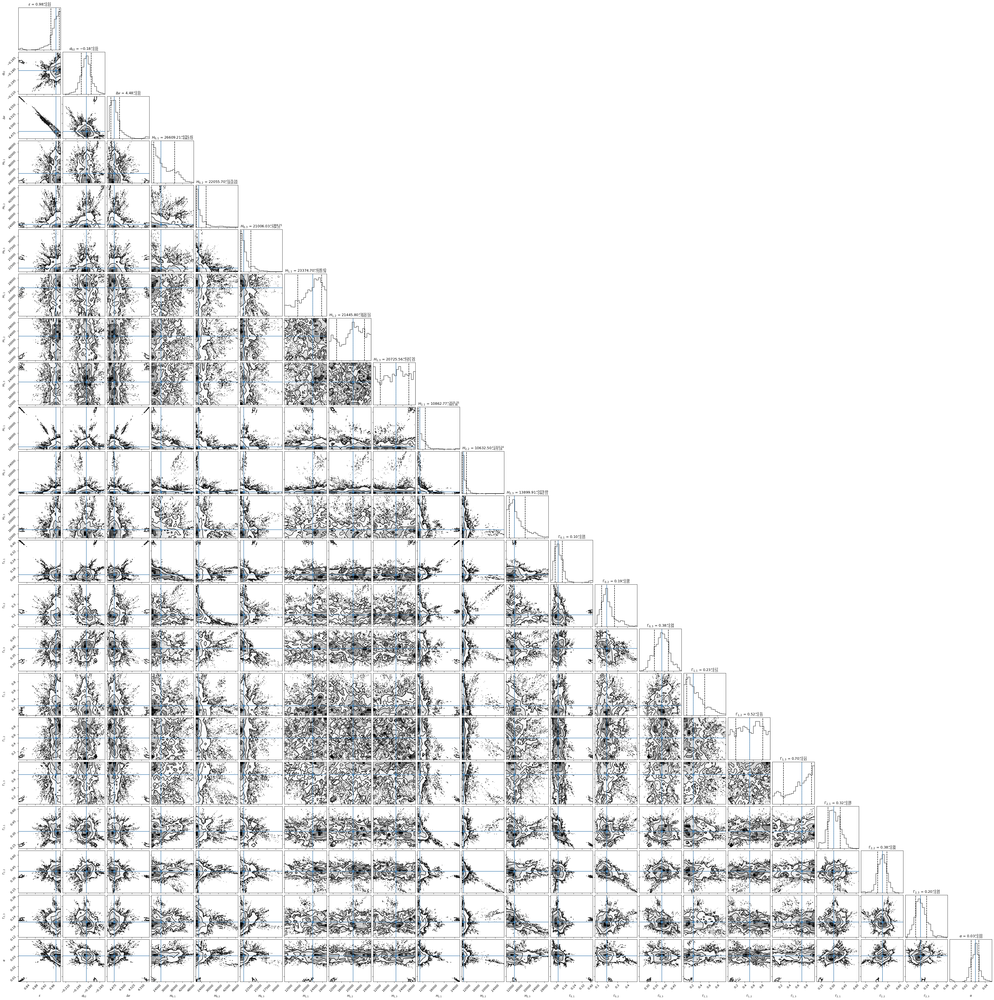

In [93]:
fig = corner.corner(
    samples,
    labels=[
        r"$\epsilon$", r"$d_{02}$", r"$\Delta\nu$",
        r"$H_{0,1}$", r"$H_{0,2}$", r"$H_{0,3}$",
        r"$H_{1,1}$", r"$H_{1,2}$", r"$H_{1,3}$",
        r"$H_{2,1}$", r"$H_{2,2}$", r"$H_{2,3}$",
        r"$\Gamma_{0,1}$", r"$\Gamma_{0,2}$", r"$\Gamma_{0,3}$",
        r"$\Gamma_{1,1}$", r"$\Gamma_{1,2}$", r"$\Gamma_{1,3}$",
        r"$\Gamma_{2,1}$", r"$\Gamma_{2,2}$", r"$\Gamma_{2,3}$",
        r"$\alpha$"
    ],
    truths=best_params,  # Optional: overlay the initial parameter guesses
    quantiles=[0.16, 0.5, 0.84],  # Show 16th, 50th, and 84th percentiles
    show_titles=True,  # Display the mean ± std in the diagonal plots
    title_fmt=".2f",   # Format for the titles
)


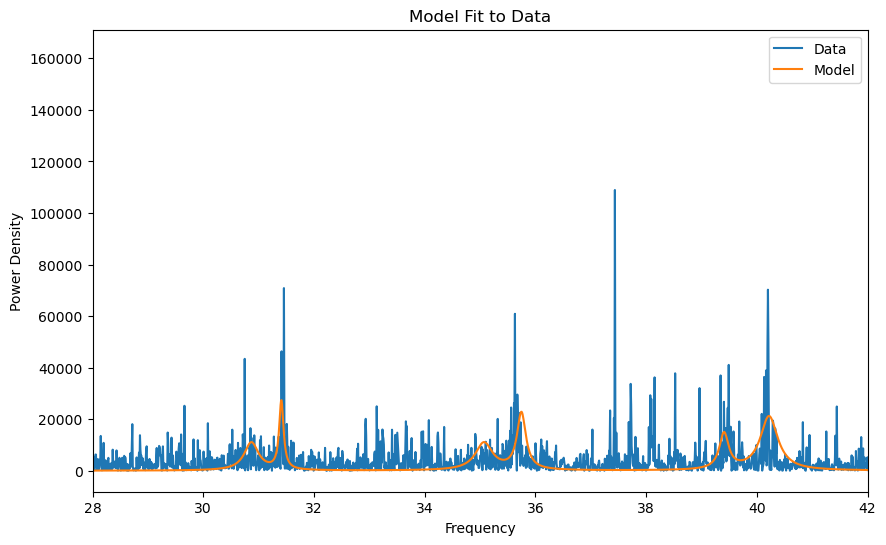

In [94]:
# Unpack the parameters from best_params
epsilon, d02, Delta_nu = best_params[:3]
heights_l0 = best_params[3:6]
heights_l1 = best_params[6:9]
heights_l2 = best_params[9:12]
gammas_l0 = best_params[12:15]
gammas_l1 = best_params[15:18]
gammas_l2 = best_params[18:21]
alpha = best_params[21]

# Plot the data and the model
plt.figure(figsize=(10, 6))
plt.plot(freq, psd, label="Data")
plt.plot(
    freq,
    lorentzian_sum(freq, heights_l0, heights_l1, heights_l2, gammas_l0, gammas_l1, gammas_l2, epsilon, d02, Delta_nu, alpha),
    label="Model"
)
plt.xlim(28, 42)
plt.legend()
plt.xlabel("Frequency")
plt.ylabel("Power Density")
plt.title("Model Fit to Data")
plt.show()


In [97]:
# print the value of alpha
print('alpha',alpha)


alpha 0.030348869764788823


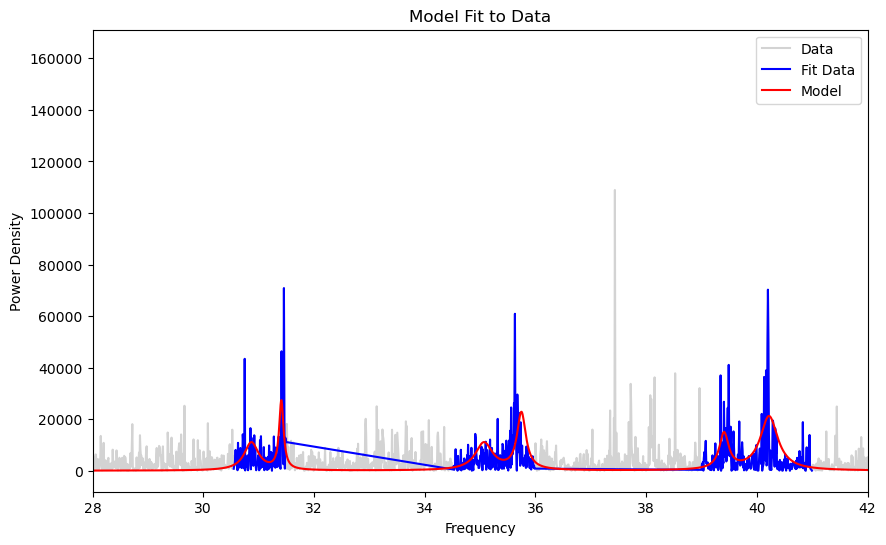

In [96]:
# Unpack the parameters from best_params
epsilon, d02, Delta_nu = best_params[:3]
heights_l0 = best_params[3:6]
heights_l1 = best_params[6:9]
heights_l2 = best_params[9:12]
gammas_l0 = best_params[12:15]
gammas_l1 = best_params[15:18]
gammas_l2 = best_params[18:21]
alpha = best_params[21]

# Plot the data and the model
plt.figure(figsize=(10, 6))
# Plot the entire data in light gray
plt.plot(freq, psd, color='lightgray', label="Data")

# Highlight the fit part in bright blue
fit_mask = (freq > 30.55) & (freq < 31.5) | (freq > 34.5) & (freq < 36) | (freq > 39) & (freq < 41)
plt.plot(freq[fit_mask], psd[fit_mask], color='blue', label="Fit Data")

# Plot the model
plt.plot(
    freq,
    lorentzian_sum(freq, heights_l0, heights_l1, heights_l2, gammas_l0, gammas_l1, gammas_l2, epsilon, d02, Delta_nu, alpha),
    color='red', label="Model"
)

plt.xlim(28, 42)
plt.legend()
plt.xlabel("Frequency")
plt.ylabel("Power Density")
plt.title("Model Fit to Data")
plt.show()
